In [8]:
import numpy as np

In [79]:
y0=[0.97000436, -0.24308753, 0.93240737/2, 0.86473146/2, -0.97000436, 0.24308753, 0.93240737/2, 0.86473146/2, 0, 0, -0.93240737, -0.86473146]
#y0=[-1, 0, 0.439166, 0.452968, 1, 0, 0.439166,0.452968, 0,0, -2*0.439166, -2*0.452968]
y0=[600, 500, 43.9166, 45.2968, 800, 500, 43.9166,45.2968, 700,500, -2*43.9166, -2*45.2968]
y=[y0]
masses=[1, 1, 1]

In [45]:
def rkck(f, x, y, h, tol):
    #xn = x + h
    err = 2 * tol
    while (err > tol):
        xn = x + h
        k1 = h*f(x,y)
        k2 = h*f(x+(1/5)*h,y+((1/5)*k1)) 
        k3 = h*f(x+(3/10)*h,y+((3/40)*k1)+((9/40)*k2))
        k4 = h*f(x+(3/5)*h,y+((3/10)*k1)-((9/10)*k2)+((6/5)*k3))
        k5 = h*f(x+(1/1)*h,y-((11/54)*k1)+((5/2)*k2)-((70/27)*k3)+((35/27)*k4))
        k6 = h*f(x+(7/8)*h,y+((1631/55296)*k1)+((175/512)*k2)+((575/13824)*k3)+((44275/110592)*k4)+((253/4096)*k5))
        dy4 = ((37/378)*k1)+((250/621)*k3)+((125/594)*k4)+((512/1771)*k6)
        dy5 = ((2825/27648)*k1)+((18575/48384)*k3)+((13525/55296)*k4)+((277/14336)*k5)+((1/4)*k6)
        err = 1e-2*tol+max(abs(dy4-dy5))
        # h = 0.95 * h * (tol/err)**(1/5)
        h = 0.8 * h * (tol*h/err)**(1/4)
        yn = y+dy4
    return xn, yn, h

def integrate_sStepControl(f, t0, y0, tend, h, tol):
    T = [t0]
    Y = [y0]
    t = t0
    y = np.array(y0) 
    while (t < tend):
        h = min(h, tend-t)
        t, y, h = rkck(f, t, y, h, tol)
        T.append(t)
        Y.append(y)
        print(h)
    return T, Y


In [46]:
def integrate_sStepControl(f, t0, y0, tend, h):
    T = [t0]
    Y = [y0]
    t = t0
    y = np.array(y0) 
    while (t < tend):
        [t, y] = runge_kutta(f, t, y, h)
        T.append(t)
        Y.append(y)
    return T, Y


In [58]:
y[0]

[-1,
 0,
 0.439166,
 0.452968,
 1,
 0,
 0.439166,
 0.452968,
 0,
 0,
 -0.878332,
 -0.905936]

In [62]:
runge_kutta(f, 0, y[0], 0.0001)

SUMA: [-9.99978042e-01  2.26484000e-05  4.39228500e-01  4.52968000e-01
  1.00002196e+00  2.26484000e-05  4.39103500e-01  4.52968000e-01
 -4.39166000e-05 -4.52968000e-05 -8.78332000e-01 -9.05936000e-01]
[ 4.39166e-05  4.52968e-05  1.25000e-04  0.00000e+00  4.39166e-05
  4.52968e-05 -1.25000e-04  0.00000e+00 -8.78332e-05 -9.05936e-05
  0.00000e+00  0.00000e+00] [ 4.39228500e-05  4.52968000e-05  1.25013176e-04 -6.79586289e-09
  4.39103500e-05  4.52968000e-05 -1.24986826e-04 -6.79317736e-09
 -8.78332000e-05 -9.05936000e-05 -2.63499599e-08  1.35890403e-08] [ 4.39228507e-05  4.52967997e-05  1.25013176e-04 -6.79586296e-09
  4.39103507e-05  4.52967997e-05 -1.24986826e-04 -6.79317743e-09
 -8.78332013e-05 -9.05935993e-05 -2.63499601e-08  1.35890404e-08] [ 4.39291013e-05  4.52967993e-05  1.25026354e-04 -1.35944123e-08
  4.39041013e-05  4.52967993e-05 -1.24973654e-04 -1.35836701e-08
 -8.78332026e-05 -9.05935986e-05 -5.26999207e-08  2.71780824e-08]


(0.0001,
 array([-9.99956077e-01,  4.52967998e-05,  4.39291013e-01,  4.52967993e-01,
         1.00004391e+00,  4.52967998e-05,  4.39041013e-01,  4.52967993e-01,
        -8.78332009e-05, -9.05935995e-05, -8.78332026e-01, -9.05935986e-01]))

In [67]:
def runge_kutta(f, t, y, h):

    k1 = h * f(t, y)
    k2 = h * f(t + h/2, y + k1/2)
    k3 = h * f(t + h/2, y + k2/2)
    k4 = h * f(t + h, y + k3)
    
    y = y + (k1 + 2*k2 + 2*k3 + k4) / 6
    t = t + h
    
    return t, y


In [48]:
masses = [1, 1, 1]

In [49]:
def f(t,y):
    # We copy the values know from state into yprime
    yprime = [0] * len(y)
    
    yprime[0] = y[2]
    yprime[1] = y[3]

    yprime[4] = y[6]
    yprime[5] = y[7]

    yprime[8] = y[10]
    yprime[9] = y[11]

    yprime[2] = (y[8]-y[0]) / (((y[8]-y[0])**2 + (y[9]-y[1])**2))**1.5 * masses[2] + \
                (y[4]-y[0]) / (((y[4]-y[0])**2 + (y[5]-y[1])**2))**1.5 * masses[1]

    yprime[3] = (y[9]-y[1]) / (((y[8]-y[0])**2 + (y[9]-y[1])**2))**1.5 * masses[2] + \
                (y[5]-y[1]) / (((y[4]-y[0])**2 + (y[5]-y[1])**2))**1.5 * masses[1]

    yprime[6] = (y[0]-y[4]) / (((y[0]-y[4])**2 + (y[1]-y[5])**2))**1.5 * masses[0] + \
                (y[8]-y[4]) / (((y[8]-y[4])**2 + (y[9]-y[5])**2))**1.5 * masses[2]

    yprime[7] = (y[1]-y[5]) / (((y[0]-y[4])**2 + (y[1]-y[5])**2))**1.5 * masses[0] + \
                (y[9]-y[5]) / (((y[8]-y[4])**2 + (y[9]-y[5])**2))**1.5 * masses[2]

    yprime[10] = (y[0]-y[8]) / (((y[0]-y[8])**2 + (y[1]-y[9])**2))**1.5 * masses[0] + \
                (y[4]-y[8]) / (((y[4]-y[8])**2 + (y[5]-y[9])**2))**1.5 * masses[1]

    yprime[11] = (y[1]-y[9]) / (((y[0]-y[8])**2 + (y[1]-y[9])**2))**1.5 * masses[0] + \
                (y[5]-y[9]) / (((y[4]-y[8])**2 + (y[5]-y[9])**2))**1.5 * masses[1]
        
    return np.array(yprime)

In [69]:
Y[-1]

array([ 6.08812046e+02,  5.09056712e+02,  4.42214465e-01,  4.52512685e-01,
        8.08761507e+02,  5.09058161e+02,  4.37118263e-01,  4.52803426e-01,
        6.82426447e+02,  4.81885127e+02, -8.79332728e-01, -9.05316111e-01])

In [80]:
[T, Y] = integrate_sStepControl(f, 0, y0, 20, 0.0001)

600 500 800 500 700 500
601.3174980574511 501.3589039993513 801.3174979449186 501.3589039994235 697.3650039976296 497.282192001226
602.6349962347226 502.7178079944873 802.6349957842051 502.7178079956488 694.7300079810698 494.5643840098647
603.9524945393833 504.0767119802398 803.9524935243124 504.07671198613275 692.0950119363015 491.84657603362837
605.2699929791098 505.4356159502619 805.2699911712208 505.43561596893176 689.4600158496662 489.1287680808076
606.587491561452 506.7945198968931 806.5874887304338 506.7945199425881 686.8250197081128 486.41096016051915
607.9049902934971 508.1534238110724 807.9049862069926 508.15342390603854 684.1900234995073 483.6931522828886
609.2224891814715 509.5123276823226 809.2224836055021 509.51232785853364 681.5550272130242 480.97534445914374
610.539988230254 510.8712314988551 810.5399809301545 510.87123179957297 678.9200308395879 478.2575367015717
611.8574874428767 512.2301352478295 811.8574781847694 512.2301357288527 676.2850343723494 475.5397290233177

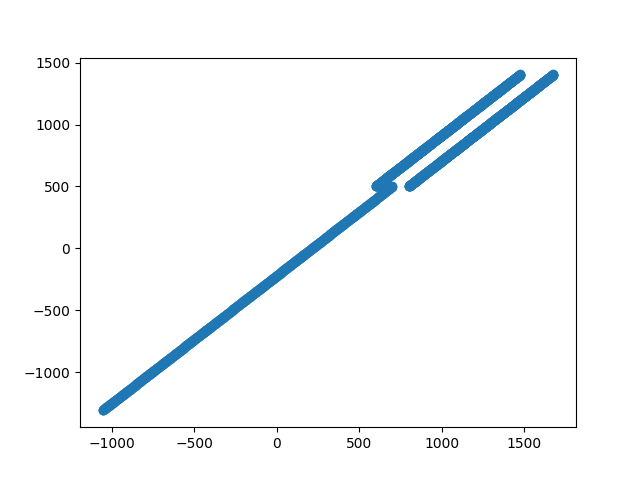

In [81]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
# creating a blank window 
# for the animation  
fig = plt.figure()  
axis = plt.axes()  

# initializing empty values 
# for x and y co-ordinates 
xdata, ydata = [], []  
   
# animation function  
def animate(i):  
    # t is a parameter which varies 
    # with the frame number 
    x1 = Y[i][0]
    y1 = Y[i][1]
    x2 = Y[i][4]
    y2 = Y[i][5]
    x3 = Y[i][8]
    y3 = Y[i][9]
    print(x1, y1, x2, y2, x3, y3)
    xdata.append(x1)
    ydata.append(y1)
    
    xdata.append(x2)
    ydata.append(y2)

    xdata.append(x3)
    ydata.append(y3)

for i in range(len(Y)):
    if(i% 300 == 0):
        animate(i)

plt.scatter( xdata, ydata)


In [15]:
Y

[[-1,
  0,
  0.306893,
  0.125507,
  1,
  0,
  0.306893,
  0.125507,
  0,
  0,
  -0.613786,
  -0.251014],
 array([-9.99969304e-01,  1.25506999e-05,  3.07018009e-01,  1.25506998e-01,
         1.00003068e+00,  1.25506999e-05,  3.06768009e-01,  1.25506998e-01,
        -6.13786006e-05, -2.51013999e-05, -6.13786018e-01, -2.51013996e-01]),
 array([-9.99938596e-01,  2.51013995e-05,  3.07143037e-01,  1.25506992e-01,
         1.00006135e+00,  2.51013995e-05,  3.06643037e-01,  1.25506992e-01,
        -1.22757205e-04, -5.02027990e-05, -6.13786074e-01, -2.51013985e-01]),
 array([-9.99907876e-01,  3.76520983e-05,  3.07268083e-01,  1.25506983e-01,
         1.00009201e+00,  3.76520983e-05,  3.06518083e-01,  1.25506983e-01,
        -1.84135817e-04, -7.53041966e-05, -6.13786166e-01, -2.51013966e-01]),
 array([-9.99877143e-01,  5.02027960e-05,  3.07393147e-01,  1.25506970e-01,
         1.00012266e+00,  5.02027960e-05,  3.06393147e-01,  1.25506970e-01,
        -2.45514439e-04, -1.00405592e-04, -6.1378629

In [16]:
def animate(i):  
    # t is a parameter which varies 
    # with the frame number 
    x1 = Y[i][0]
    y1 = Y[i][1]
    x2 = Y[i][4]
    y2 = Y[i][5]
    x3 = Y[i][8]
    y3 = Y[i][9]
    print(x1, y1, x2, y2, x3, y3)

for i in range(len(Y)):
    print(Y[i][0], Y[i][1], Y[i][4], Y[i][5], Y[i][8], Y[i][9])

-1 0 1 0 0 0
-0.9999693044496931 1.2550699937237833e-05 1.000030683050307 1.2550699937255167e-05 -6.137860061378602e-05 -2.5101399874493004e-05
-0.9999385963975443 2.5101399497833302e-05 1.0000613536024547 2.5101399498110627e-05 -0.00012275720491028826 -5.020279899594393e-05
-0.9999078758417113 3.765209830495324e-05 1.0000920116582837 3.765209830635719e-05 -0.00018413581657222389 -7.530419661131043e-05
-0.9998771427803506 5.0202795981556205e-05 1.0001226572196331 5.020279598599339e-05 -0.00024551443928231187 -0.00010040559196754959
-0.999846397211618 6.275349215039234e-05 1.0001532902883417 6.275349216122532e-05 -0.0003068930767232739 -0.00012550698431161765
-0.999815639133669 7.530418643400323e-05 1.0001839108662471 7.530418645646649e-05 -0.00036827173257783546 -0.00015060837289046971
-0.9997848685446578 8.785487845472175e-05 1.0002145189551868 8.785487849633772e-05 -0.0004296504105287264 -0.00017570975695105947
-0.9997540854427378 0.00010040556783467194 1.0002451145569968 0.000100405

In [40]:
%matplotlib ipympl

In [41]:
# creating a blank window 
# for the animation  
fig = plt.figure()  
axis = plt.axes(xlim =(-2, 2), 
                ylim =(-2, 2))  
  
line, = axis.plot([], [], lw = 2)  
   
# what will our line dataset 
# contain? 
def init():  
    line.set_data([], [])  
    return line,  
   
# initializing empty values 
# for x and y co-ordinates 
xdata, ydata = [], []  
   
# animation function  
def animate(i):  
    # t is a parameter which varies 
    # with the frame number 
    line.set_data(xdata, ydata)  
      
    return line, 
   
# calling the animation function      
anim = animation.FuncAnimation(fig, animate, init_func = init,  
                               frames = 300, interval = 20, blit = True)  

NameError: name 'plt' is not defined